## Notebook for Gut Cell Atlas Quality Check 

+ Developed by: Anna Maguza
+ Institute of Computational Biology - Computational Health Centre - Hemlholtz Munich
+ Date created: 4th July 2023
+ Last modified: 22nd May 2024

#### Load required packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [2]:
import scrublet as scr

#### Setup Cells

In [3]:
%matplotlib inline

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.5 anndata==0.9.2 umap==0.5.4 numpy==1.24.4 scipy==1.13.0 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.2 pynndescent==0.5.10


In [5]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Upload Data

In [6]:
input_dir = '/mnt/LaCIE/annaM/gut_project/raw_data/Elmentaite_2021/'
GCA_adata = sc.read(f'{input_dir}/GCA_raw_anndata.h5ad')
X_is_raw(GCA_adata)

True

#### Modify obs

In [7]:
GCA_adata.obs['Study_name'] = 'Elmentaite, 2021'

In [8]:
#Remove Pediatric Crohn Disease
GCA_adata = GCA_adata[~GCA_adata.obs['Diagnosis'].isin(['Pediatric Crohn Disease']),:]
#Deleting the lymph node samples
GCA_adata = GCA_adata[~GCA_adata.obs['Region'].isin(['lymph node']),:]

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [9]:
#Adding percentage of ribosomial genes
GCA_adata.var['ribo'] = GCA_adata.var_names.str.startswith(("RPS","RPL"))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(GCA_adata, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_632262/1901056640.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  GCA_adata.var['ribo'] = GCA_adata.var_names.str.startswith(("RPS","RPL"))  # annotate the group of ribosomal genes as 'ribo'


In [10]:
GCA_adata.obs.rename(columns = {'10X': 'Library_Preparation_Protocol'}, inplace = True)
GCA_adata.obs.rename(columns = {'Gender': 'Sex'}, inplace = True)
GCA_adata.obs['Diagnosis'] = GCA_adata.obs['Diagnosis'].replace('fetal', 'Fetal Healthy')
GCA_adata.obs['Diagnosis'] = GCA_adata.obs['Diagnosis'].replace('Healthy', 'Healthy adult')
GCA_adata.obs['Sex'] = GCA_adata.obs['Sex'].replace('M', 'Male')
GCA_adata.obs['Sex'] = GCA_adata.obs['Sex'].replace('F', 'Female')

In [11]:
GCA_adata.obs.rename(columns = {'Sample name': 'Donor_ID'}, inplace = True)
GCA_adata.obs.rename(columns = {'sample name': 'Sample_ID'}, inplace = True)
GCA_adata.obs.rename(columns = {'Integrated_05': 'Cell_State'}, inplace = True)
GCA_adata.obs.rename(columns = {'Region': 'Location'}, inplace = True)
GCA_adata.obs.rename(columns = {'category': 'Cell_Type'}, inplace = True)

In [12]:
GCA_adata.obs['Sample_ID'] = GCA_adata.obs.apply(
    lambda row: row['Sample_ID'] if row['Sample_ID'].lower() != "nan" else
    (row['Donor_ID'] + '_' + str(row['Age']) + '_' + row['Region code'] + '_' + str(row['Fraction'])),
    axis=1
)

GCA_adata.obs['Donor_ID'] = GCA_adata.obs['Donor_ID'].astype('str')
GCA_adata.obs['Age'] = GCA_adata.obs['Age'].astype('str')
GCA_adata.obs['Region code'] = GCA_adata.obs['Region code'].astype('str')
GCA_adata.obs['Fraction'] = GCA_adata.obs['Fraction'].astype('str')

GCA_adata.obs['Sample_ID'] = GCA_adata.obs['Sample_ID'].where(
    pd.notna(GCA_adata.obs['Sample_ID']),
    GCA_adata.obs['Donor_ID'] + '_' + GCA_adata.obs['Age'].astype(str) + '_' +
    GCA_adata.obs['Region code'] + '_' + GCA_adata.obs['Fraction'].astype(str)
)

In [13]:
# Rename values in Cancer_adata.obs['ClusterTop'] as in Healthy_adata.obs['Cell Type']
GCA_adata.obs['Location'].replace({'SmallInt' : 'Small Intestine',
                                            'Small Bowel' : 'Small Intestine',
                                            'LargeInt': 'Large Intestine',
                                            'Colon': 'Large Intestine',
                                            'REC' : 'Rectum',
                                            'Epi': 'Epithelium',
                                            'LP': 'Lamina Propria'}, inplace=True)

In [14]:
GCA_adata.obs['Library_Preparation_Protocol'].replace({"3'" : "10x 3' v1",
                                            "5'" : "10x 5' v1",
                                            "nan" : "10x 3' v1"}, inplace=True)

### Fill the table

In [15]:
# Calculate number of donors
len(GCA_adata.obs.Donor_ID.unique())

34

In [16]:
# Calculate number of samples
len(GCA_adata.obs.Sample_ID.unique())

143

In [17]:
# calculate number of adult samples
len(GCA_adata.obs[GCA_adata.obs['Diagnosis'].isin(['Healthy adult'])].Sample_ID.unique())

75

In [18]:
# calculate number of fetal samples
len(GCA_adata.obs[GCA_adata.obs['Diagnosis'].isin(['Fetal Healthy'])].Sample_ID.unique())

58

In [19]:
# calculate number of Pediatric samples
len(GCA_adata.obs[GCA_adata.obs['Diagnosis'].isin(['Pediatric healthy'])].Sample_ID.unique())

10

In [20]:
#Total Counts
sum(GCA_adata.obs.total_counts)

2521553659.0

In [21]:
# calculate mean cells per sample
GCA_adata.obs.groupby('Sample_ID').size().mean()

2671.097902097902

In [22]:
# calculate mean reads per cell 
sum(GCA_adata.obs.total_counts)/len(GCA_adata.obs)

6601.496095212414

In [23]:
#Mean Genes per Cell
sum(GCA_adata.obs.n_genes_by_counts)/len(GCA_adata.obs)

1825.3839520167974

In [24]:
#Mean percentage of mitochondrial counts 
sum(GCA_adata.obs.pct_counts_mt)/len(GCA_adata.obs)

9.81888719535302

In [25]:
# Mean percentage of ribosomal counts
sum(GCA_adata.obs.pct_counts_ribo)/len(GCA_adata.obs)

23.282191512571586

In [26]:
# Number of predicted_doublets == True
GCA_adata.obs['predicted_doublets'].value_counts()

predicted_doublets
False    381967
Name: count, dtype: int64

In [27]:
GCA_adata.obs['Cell_Type'].value_counts()

Cell_Type
Mesenchymal        156309
Epithelial         137673
Neuronal            17802
T cells             17398
Plasma cells        16453
Endothelial         13730
B cells             11414
Myeloid              9826
Red blood cells      1362
Name: count, dtype: int64

In [28]:
GCA_adata.obs['Location'].value_counts()

Location
Small Intestine    238084
Large Intestine    119075
Rectum              18430
APD                  6378
Name: count, dtype: int64

In [29]:
GCA_adata.obs['Library_Preparation_Protocol'].value_counts()

Library_Preparation_Protocol
10x 3' v1    199601
10x 5' v1    182366
Name: count, dtype: int64

#### Create Violin Plots

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

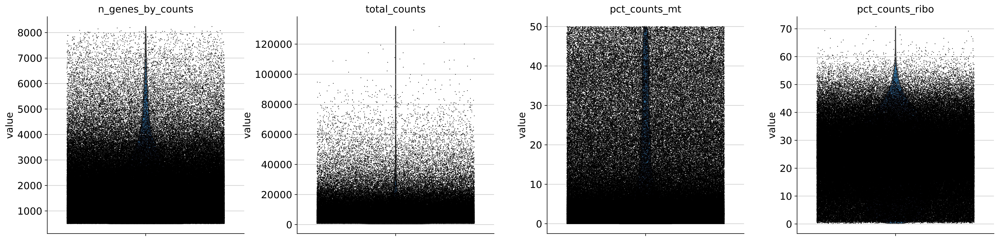

In [30]:
#A violin plot of some of the computed quality measures:
    # the number of genes expressed in the count matrix
    #the total counts per cell
    #the percentage of counts in mitochondrial genes
    #the percentage of counts in ribosomial genes
sc.set_figure_params(dpi=300)
sc.pl.violin(GCA_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

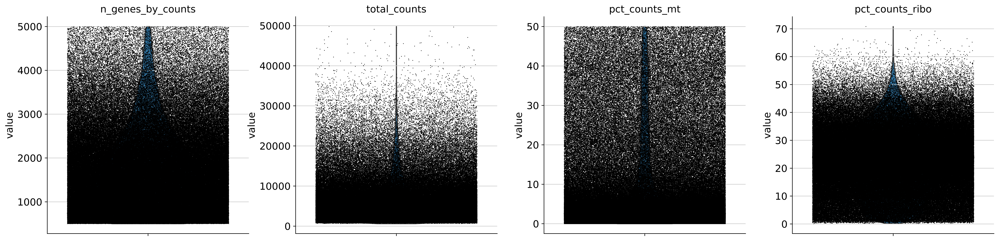

In [31]:
#Filtering by genes
GCA_adata = GCA_adata[GCA_adata.obs.n_genes_by_counts < 5000, :]
GCA_adata = GCA_adata[GCA_adata.obs.n_genes_by_counts > 200, :]
GCA_adata = GCA_adata[GCA_adata.obs.total_counts < 50000, :]

sc.set_figure_params(dpi=300)
sc.pl.violin(GCA_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

In [32]:
GCA_adata.write(f'{input_dir}/GCA_filtered_raw.h5ad')